In [17]:
import pyarrow.parquet as pq

path = "../source_data/internspatial/video_00002.parquet"
import pyarrow.parquet as pq
from PIL import Image
import io

path = "../source_data/internspatial/video_00088.parquet"
pf = pq.ParquetFile(path)

it = pf.iter_batches(batch_size=1, columns=["conversations", "image"])
batch = next(it)
row = batch.to_pylist()[0]

for turn in row["conversations"]:
  print(f"[{turn['from']}] {turn['value']}")

imgs = [Image.open(io.BytesIO(b)).convert("RGB") for b in row["image"]]
print(len(imgs), imgs[0].size)

[human] Image-1: <image>
Image-2: <image>
Image-3: <image>
Image-4: <image>
Image-5: <image>
Image-6: <image>
Image-7: <image>
Image-8: <image>
Image-9: <image>
Image-10: <image>
Image-11: <image>
Image-12: <image>
Image-13: <image>
Image-14: <image>
Image-15: <image>
Image-16: <image>
Image-17: <image>
Image-18: <image>
Image-19: <image>
Image-20: <image>
Image-21: <image>
Image-22: <image>
Image-23: <image>
Image-24: <image>
Image-25: <image>
Image-26: <image>
Image-27: <image>
Image-28: <image>
Image-29: <image>
Image-30: <image>
Image-31: <image>
Image-32: <image>
Measuring from the closest point of each object, what is the distance between the woodcarving and the mirror (in meters)?
Please answer the question using a single word or phrase.
[gpt] 2.3
32 (1920, 1440)


[human] Image-1: <image>
Image-2: <image>
Image-3: <image>
Image-4: <image>
Image-5: <image>
Image-6: <image>
Image-7: <image>
Image-8: <image>
Image-9: <image>
Image-10: <image>
Image-11: <image>
Image-12: <image>
Image-13: <image>
Image-14: <image>
Image-15: <image>
Image-16: <image>
Image-17: <image>
Image-18: <image>
Image-19: <image>
Image-20: <image>
Image-21: <image>
Image-22: <image>
Image-23: <image>
Image-24: <image>
Image-25: <image>
Image-26: <image>
Image-27: <image>
Image-28: <image>
Image-29: <image>
Image-30: <image>
Image-31: <image>
Image-32: <image>
Measuring from the closest point of each object, what is the distance between the woodcarving and the mirror (in meters)?
Please answer the question using a single word or phrase.
[gpt] 2.3
saved -> /tmp/preview.jpg


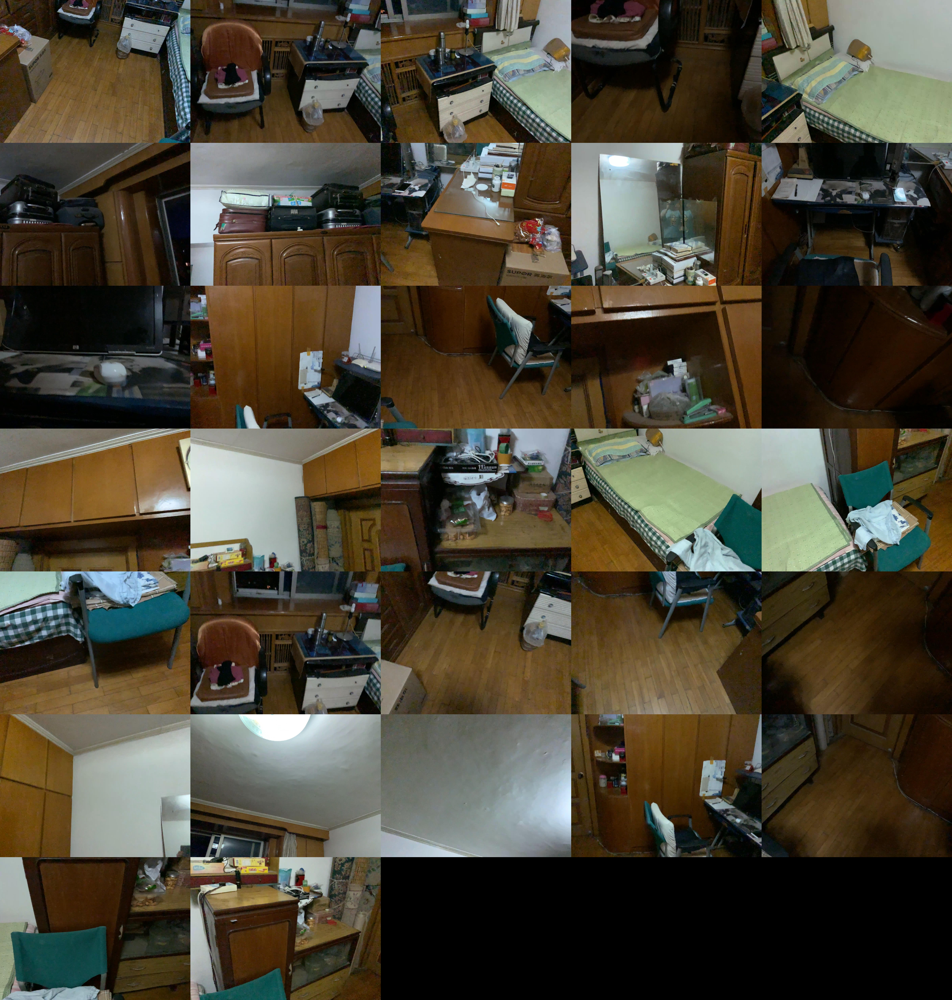

In [18]:

import math

def show_row(row, save_path="/tmp/preview.jpg"):
  for turn in row["conversations"]:
      print(f"[{turn['from']}] {turn['value']}")
  imgs = [Image.open(io.BytesIO(b)).convert("RGB") for b in row["image"]]
  n = len(imgs)
  cols = min(n, 5)
  rows_ = math.ceil(n / cols)
  w, h = imgs[0].size
  thumb_w, thumb_h = w // 3, h // 3  # 缩小拼图，原图太大
  grid = Image.new("RGB", (thumb_w * cols, thumb_h * rows_))
  for i, im in enumerate(imgs):
      r, c = divmod(i, cols)
      grid.paste(im.resize((thumb_w, thumb_h)), (c * thumb_w, r * thumb_h))
  grid.save(save_path)
  print("saved ->", save_path)
  from IPython.display import display
  display(grid)
show_row(row)

In [12]:

from collections import Counter

fmt_counter = Counter()
sample_q = {}

it = pf.iter_batches(batch_size=1, columns=["conversations"])
for i, batch in enumerate(it):
  if i >= 200: break
  q = batch.to_pylist()[0]["conversations"][0]["value"]
  if "<ref>" in q or "<box>" in q:
      fmt = "ref/box"
  elif "mask" in q.lower():
      fmt = "mask"
  elif "circled" in q.lower() or "numbered" in q.lower():
      fmt = "number"
  else:
      fmt = "plain_language"
  fmt_counter[fmt] += 1
  sample_q.setdefault(fmt, q)

print(fmt_counter)
for fmt, q in sample_q.items():
  print("---", fmt, "---")
  print(q[:200])

Counter({'plain_language': 200})
--- plain_language ---
Image-1: <image>
Image-2: <image>
Image-3: <image>
Image-4: <image>
Image-5: <image>
Image-6: <image>
Image-7: <image>
Image-8: <image>
Image-9: <image>
Image-10: <image>
Image-11: <image>
Measuring f
